IMPORTING THE LIBRARIES

In [ ]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from scipy.stats import zscore
from sklearn.preprocessing import StandardScaler
import seaborn as sns
import matplotlib.pyplot as plt


DATA COLLECTION

In [ ]:
# Data Collection
df_sales = pd.read_csv('/content/supermarket_sales.csv')
df_stores = pd.read_csv('/content/Stores.csv')
print(df_sales)
print(df_stores)

      Invoice ID Branch       City Customer type  Gender  \
0    750-67-8428      A     Yangon        Member  Female   
1    226-31-3081      C  Naypyitaw        Normal  Female   
2    631-41-3108      A     Yangon        Normal    Male   
3    123-19-1176      A     Yangon        Member    Male   
4    373-73-7910      A     Yangon        Normal    Male   
..           ...    ...        ...           ...     ...   
995  233-67-5758      C  Naypyitaw        Normal    Male   
996  303-96-2227      B   Mandalay        Normal  Female   
997  727-02-1313      A     Yangon        Member    Male   
998  347-56-2442      A     Yangon        Normal    Male   
999  849-09-3807      A     Yangon        Member  Female   

               Product line  Unit price  Quantity   Tax 5%      Total  \
0         Health and beauty       74.69         7  26.1415   548.9715   
1    Electronic accessories       15.28         5   3.8200    80.2200   
2        Home and lifestyle       46.33         7  16.2155  

DATA INTEGRATION

In [ ]:
import pandas as pd

# Load datasets
df_sales = pd.read_csv('/content/supermarket_sales.csv')
df_stores = pd.read_csv('/content/Stores.csv')

# Reset indices
df_sales.reset_index(drop=True, inplace=True)
df_stores.reset_index(drop=True, inplace=True)

# Concatenate datasets along columns
merged_df = pd.concat([df_sales, df_stores], axis=1)

# Display the merged DataFrame
print(merged_df)


      Invoice ID Branch       City Customer type  Gender  \
0    750-67-8428      A     Yangon        Member  Female   
1    226-31-3081      C  Naypyitaw        Normal  Female   
2    631-41-3108      A     Yangon        Normal    Male   
3    123-19-1176      A     Yangon        Member    Male   
4    373-73-7910      A     Yangon        Normal    Male   
..           ...    ...        ...           ...     ...   
995  233-67-5758      C  Naypyitaw        Normal    Male   
996  303-96-2227      B   Mandalay        Normal  Female   
997  727-02-1313      A     Yangon        Member    Male   
998  347-56-2442      A     Yangon        Normal    Male   
999  849-09-3807      A     Yangon        Member  Female   

               Product line  Unit price  Quantity   Tax 5%      Total  ...  \
0         Health and beauty       74.69         7  26.1415   548.9715  ...   
1    Electronic accessories       15.28         5   3.8200    80.2200  ...   
2        Home and lifestyle       46.33      

DATA REDUCTION

In [ ]:
# Check for duplicates
duplicates = merged_df.duplicated()
print("Number of duplicate rows:", duplicates.sum())

# Remove duplicates
merged_df.drop_duplicates(inplace=True)

Number of duplicate rows: 0


In [ ]:
merged_df.isnull().sum()

Invoice ID                   0
Branch                       0
City                         0
Customer type                0
Gender                       0
Product line                 0
Unit price                   0
Quantity                     0
Tax 5%                       0
Total                        0
Date                         0
Time                         0
Payment                      0
cogs                         0
gross margin percentage      0
gross income                 0
Rating                       0
Store ID                   104
Store_Area                 104
Items_Available            104
Daily_Customer_Count       104
Store_Sales                104
dtype: int64

In [ ]:
# Fill null values with mean
merged_df.fillna(merged_df.mean(), inplace=True)

# Display the merged DataFrame
print(merged_df)

      Invoice ID Branch       City Customer type  Gender  \
0    750-67-8428      A     Yangon        Member  Female   
1    226-31-3081      C  Naypyitaw        Normal  Female   
2    631-41-3108      A     Yangon        Normal    Male   
3    123-19-1176      A     Yangon        Member    Male   
4    373-73-7910      A     Yangon        Normal    Male   
..           ...    ...        ...           ...     ...   
995  233-67-5758      C  Naypyitaw        Normal    Male   
996  303-96-2227      B   Mandalay        Normal  Female   
997  727-02-1313      A     Yangon        Member    Male   
998  347-56-2442      A     Yangon        Normal    Male   
999  849-09-3807      A     Yangon        Member  Female   

               Product line  Unit price  Quantity   Tax 5%      Total  ...  \
0         Health and beauty       74.69         7  26.1415   548.9715  ...   
1    Electronic accessories       15.28         5   3.8200    80.2200  ...   
2        Home and lifestyle       46.33      

<ipython-input-40-c7acecc3d699>:2: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  merged_df.fillna(merged_df.mean(), inplace=True)


In [ ]:
merged_df.isnull().sum()

Invoice ID                 0
Branch                     0
City                       0
Customer type              0
Gender                     0
Product line               0
Unit price                 0
Quantity                   0
Tax 5%                     0
Total                      0
Date                       0
Time                       0
Payment                    0
cogs                       0
gross margin percentage    0
gross income               0
Rating                     0
Store ID                   0
Store_Area                 0
Items_Available            0
Daily_Customer_Count       0
Store_Sales                0
dtype: int64

In [ ]:
merged_df.head()

,Invoice ID,Branch,City,Customer type,Gender,Product line,Unit price,Quantity,Tax 5%,Total,...,Payment,cogs,gross margin percentage,gross income,Rating,Store ID,Store_Area,Items_Available,Daily_Customer_Count,Store_Sales
0,750-67-8428,A,Yangon,Member,Female,Health and beauty,74.69,7,26.1415,548.9715,...,Ewallet,522.83,4.761905,26.1415,9.1,1.0,1659.0,1961.0,530.0,66490.0
1,226-31-3081,C,Naypyitaw,Normal,Female,Electronic accessories,15.28,5,3.8200,80.2200,...,Cash,76.40,4.761905,3.8200,9.6,2.0,1461.0,1752.0,210.0,39820.0
2,631-41-3108,A,Yangon,Normal,Male,Home and lifestyle,46.33,7,16.2155,340.5255,...,Credit card,324.31,4.761905,16.2155,7.4,3.0,1340.0,1609.0,720.0,54010.0
3,123-19-1176,A,Yangon,Member,Male,Health and beauty,58.22,8,23.2880,489.0480,...,Ewallet,465.76,4.761905,23.2880,8.4,4.0,1451.0,1748.0,620.0,53730.0
4,373-73-7910,A,Yangon,Normal,Male,Sports and travel,86.31,7,30.2085,634.3785,...,Ewallet,604.17,4.761905,30.2085,5.3,5.0,1770.0,2111.0,450.0,46620.0


In [ ]:
merged_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1000 entries, 0 to 999
Data columns (total 22 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Invoice ID               1000 non-null   object 
 1   Branch                   1000 non-null   object 
 2   City                     1000 non-null   object 
 3   Customer type            1000 non-null   object 
 4   Gender                   1000 non-null   object 
 5   Product line             1000 non-null   object 
 6   Unit price               1000 non-null   float64
 7   Quantity                 1000 non-null   int64  
 8   Tax 5%                   1000 non-null   float64
 9   Total                    1000 non-null   float64
 10  Date                     1000 non-null   object 
 11  Time                     1000 non-null   object 
 12  Payment                  1000 non-null   object 
 13  cogs                     1000 non-null   float64
 14  gross margin percentage  

In [ ]:
merged_df.describe()

,Unit price,Quantity,Tax 5%,Total,cogs,gross margin percentage,gross income,Rating,Store ID,Store_Area,Items_Available,Daily_Customer_Count,Store_Sales
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000
mean,55.672130,5.510000,15.379369,322.966749,307.58738,4.761905,15.379369,6.97270,448.500000,1485.409598,1782.035714,786.350446,59351.305804
std,26.494628,2.923431,11.708825,245.885335,234.17651,0.000000,11.708825,1.71858,244.956167,236.853779,283.834228,251.195671,16271.342746
min,10.080000,1.000000,0.508500,10.678500,10.17000,4.761905,0.508500,4.00000,1.000000,775.000000,932.000000,10.000000,14920.000000
25%,32.875000,3.000000,5.924875,124.422375,118.49750,4.761905,5.924875,5.50000,250.750000,1338.250000,1606.000000,620.000000,48135.000000
50%,55.230000,5.000000,12.088000,253.848000,241.76000,4.761905,12.088000,7.00000,448.500000,1485.409598,1782.035714,786.350446,59351.305804
75%,77.935000,8.000000,22.445250,471.350250,448.90500,4.761905,22.445250,8.50000,646.250000,1628.750000,1952.500000,940.000000,70140.000000
max,99.960000,10.000000,49.650000,1042.650000,993.00000,4.761905,49.650000,10.00000,896.000000,2229.000000,2667.000000,1560.000000,116320.000000


In [ ]:
merged_df.dtypes

Invoice ID                  object
Branch                      object
City                        object
Customer type               object
Gender                      object
Product line                object
Unit price                 float64
Quantity                     int64
Tax 5%                     float64
Total                      float64
Date                        object
Time                        object
Payment                     object
cogs                       float64
gross margin percentage    float64
gross income               float64
Rating                     float64
Store ID                   float64
Store_Area                 float64
Items_Available            float64
Daily_Customer_Count       float64
Store_Sales                float64
dtype: object

DATA TRANSFORMATION

In [ ]:
# Encode categorical columns using LabelEncoder
label_encoder = LabelEncoder()

categorical_cols = merged_df.select_dtypes(include=['object']).columns
for col in categorical_cols:
    merged_df[col] = label_encoder.fit_transform(merged_df[col])
    print(merged_df)

# Perform one-hot encoding if needed
# merged_df = pd.get_dummies(merged_df, columns=['categorical_column_name'])

OUTLIERS

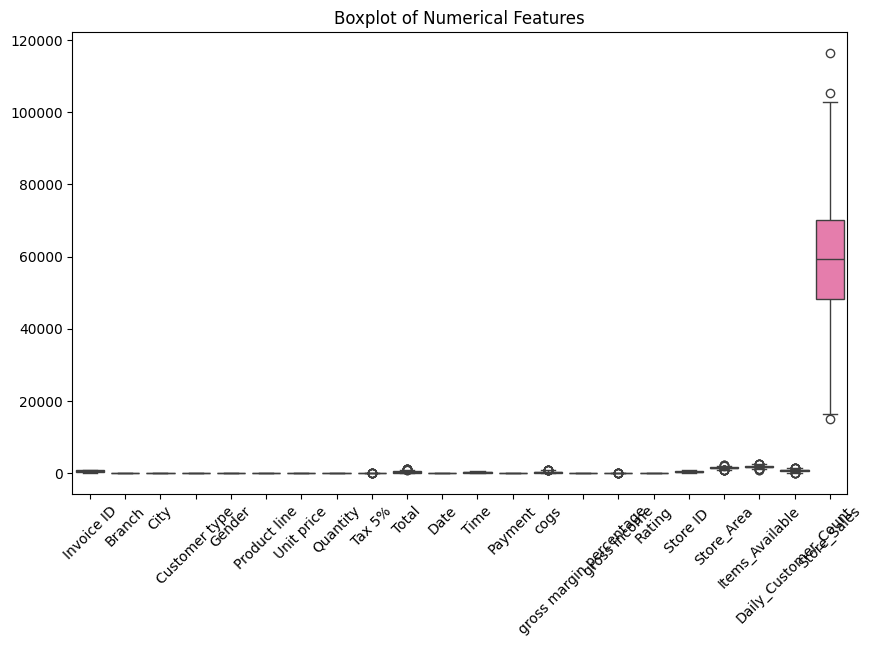

In [ ]:
# Visualize outliers with boxplot
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
sns.boxplot(data=merged_df.select_dtypes(include=['float64', 'int64']))
plt.title('Boxplot of Numerical Features')
plt.xticks(rotation=45)
plt.show()

HANDLING OUTLIERS

In [ ]:
# Handle outliers
from scipy.stats import zscore

z_scores = zscore(merged_df.select_dtypes(include=['float64', 'int64']))
abs_z_scores = abs(z_scores)
threshold = 3
outliers_mask = (abs_z_scores > threshold).any(axis=1)
merged_df = merged_df[~outliers_mask]

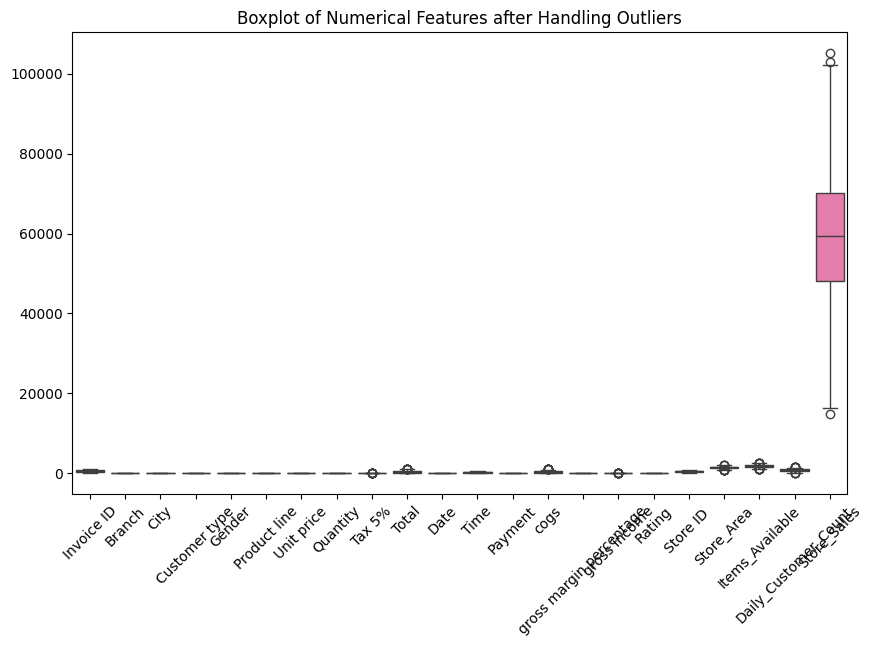

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Visualize outliers with boxplot after handling
plt.figure(figsize=(10, 6))
sns.boxplot(data=merged_df.select_dtypes(include=['float64', 'int64']))
plt.title('Boxplot of Numerical Features after Handling Outliers')
plt.xticks(rotation=45)
plt.show()


STANDARDIZATION

In [ ]:
# Perform feature scaling
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
numerical_cols = merged_df.select_dtypes(include=['float64', 'int64']).columns
merged_df[numerical_cols] = scaler.fit_transform(merged_df[numerical_cols])

2(B). EXPLORE DATA ANALYSIS(EDA)

In [ ]:
# Perform exploratory data analysis (EDA)
# Summary statistics
print(merged_df.describe())



         Invoice ID        Branch          City  Customer type        Gender  \
count  9.940000e+02  9.940000e+02  9.940000e+02     994.000000  9.940000e+02   
mean  -6.433486e-17 -2.859327e-17  1.322439e-16       0.000000  6.790901e-17   
std    1.000503e+00  1.000503e+00  1.000503e+00       1.000503  1.000503e+00   
min   -1.725824e+00 -1.206461e+00 -1.230045e+00      -1.000000 -9.959839e-01   
25%   -8.659559e-01 -1.206461e+00 -1.230045e+00      -1.000000 -9.959839e-01   
50%    8.397951e-04  1.723516e-02 -1.103730e-02       0.000000 -9.959839e-01   
75%    8.607081e-01  1.240931e+00  1.207971e+00       1.000000  1.004032e+00   
max    1.734431e+00  1.240931e+00  1.207971e+00       1.000000  1.004032e+00   

       Product line    Unit price      Quantity        Tax 5%         Total  \
count  9.940000e+02  9.940000e+02  9.940000e+02  9.940000e+02  9.940000e+02   
mean   8.577981e-17 -2.501911e-16 -7.148317e-18 -5.718654e-17  1.983658e-16   
std    1.000503e+00  1.000503e+00  1.00050

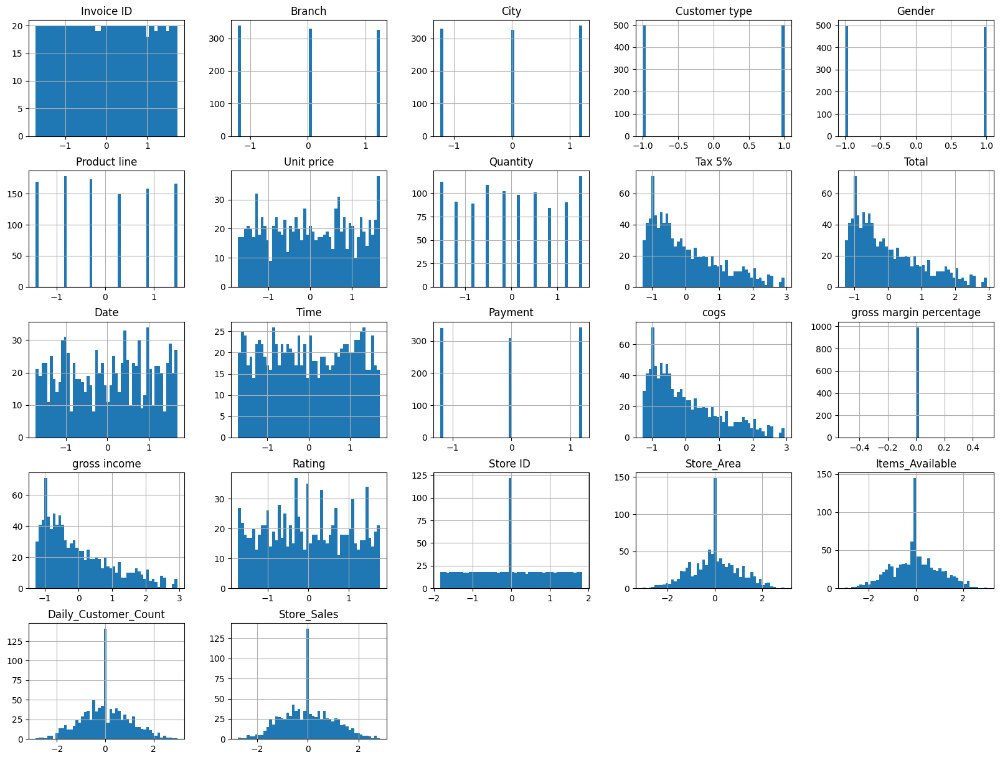

In [ ]:
merged_df.hist(bins=50,figsize=(20,15))
plt.show()

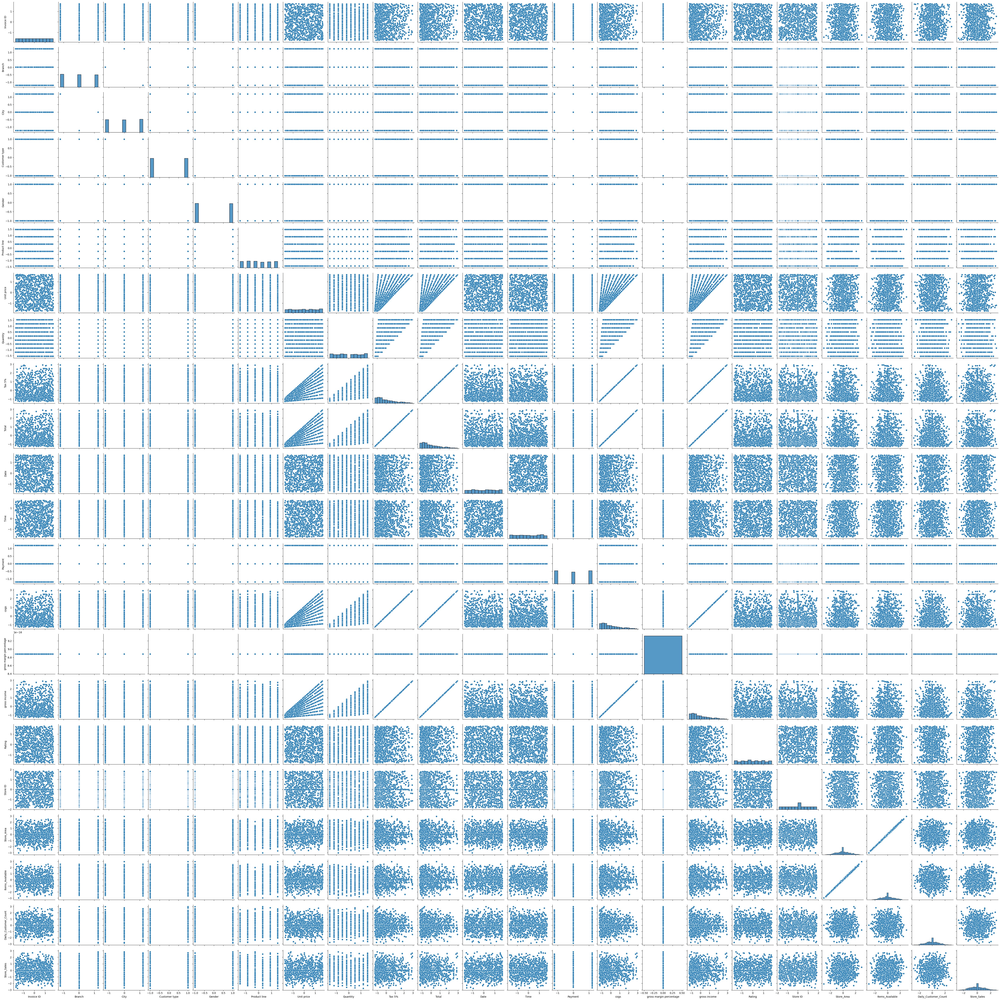

In [ ]:
# Visualizations (histograms, pairplots, correlation matrices, etc.)
sns.pairplot(merged_df)
plt.show()


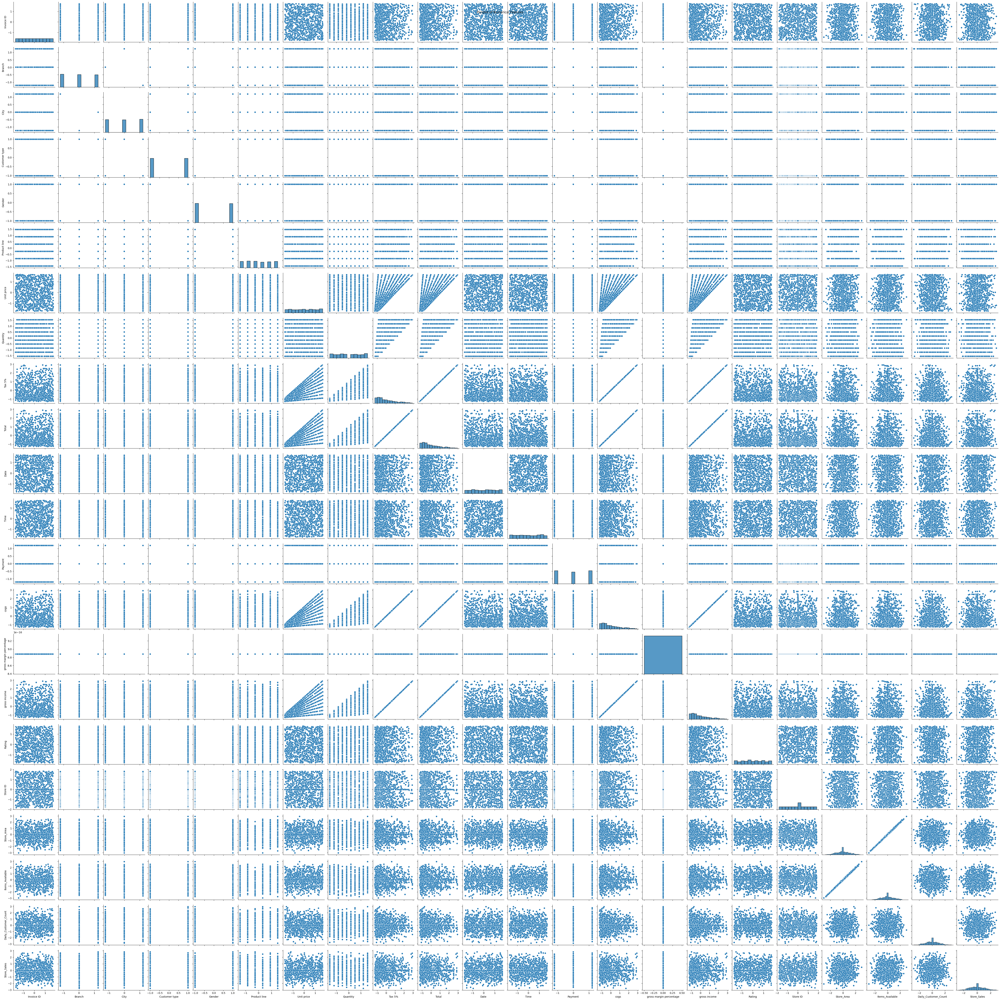

In [ ]:
# Plot pairplot
sns.pairplot(merged_df.select_dtypes(include=['float64', 'int64']))
plt.suptitle('Pairplot of Numerical Features')
plt.show()

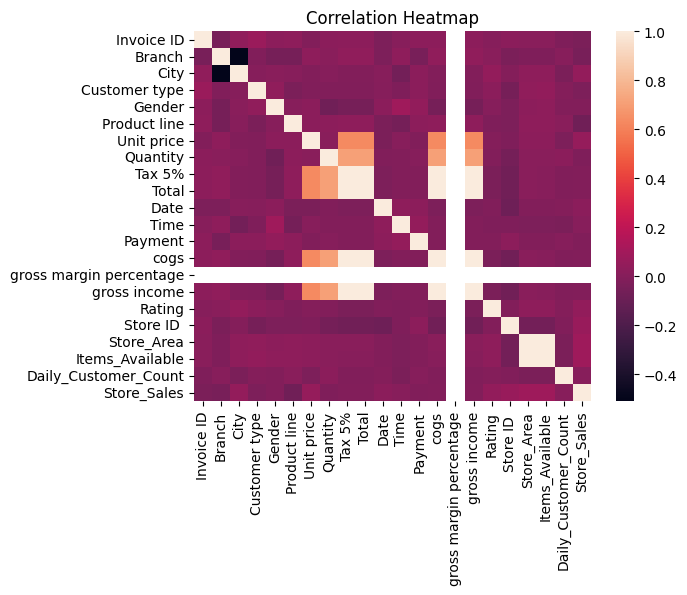

In [ ]:
corr_matrix = merged_df.corr()
sns.heatmap(corr_matrix)
plt.title('Correlation Heatmap')
plt.show()

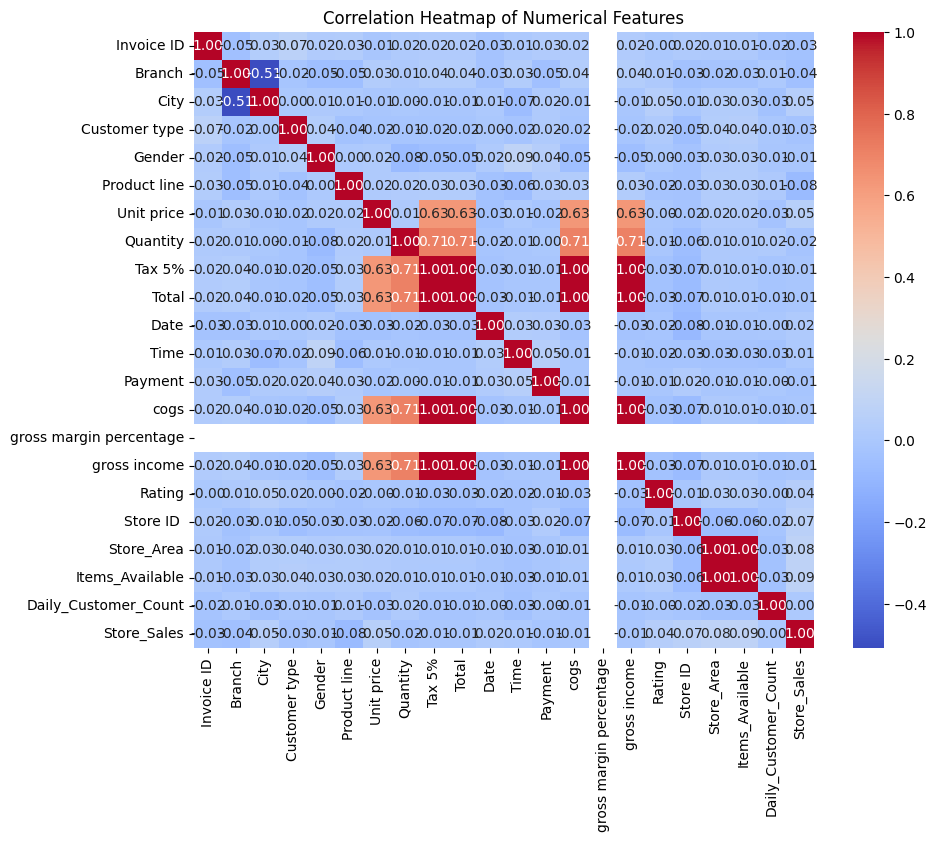

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Calculate correlation matrix
corr_matrix = merged_df.corr()

# Plot heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap of Numerical Features')
plt.show()
